In [147]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/capstone/delhi.jpg
/kaggle/input/capstone/1.jpg
/kaggle/input/capstone/rome.jpg
/kaggle/input/capstone/tokyo.jpg
/kaggle/input/capstone/1.jpeg
/kaggle/input/capstone/china.jpg
/kaggle/input/capstone/Hyd.jpeg


# Urban Chronoscope AI: Visualizing Cities Across Time

**Created by:** Godavarthi Sai Nikhil

**LinkedIn/GitHub:** [Link to your profile - Optional]

---


## 1. Introduction

### 🧩 The Challenge: Visualizing Urban Pasts & Futures

Ever wondered how your street looked in the 1800s or how it might evolve by 2070? Visualizing urban environments across time is difficult due to:

- **Scarcity:** Limited visual records for many historical periods.
- **Complexity:** Requires synthesizing diverse data (architecture, culture, tech).
- **Accessibility:** Non-experts struggle to explore or create such visuals.

---

### 🚀 The Solution: Urban Chronoscope AI

**Urban Chronoscope AI** is a multimodal generative AI system that transforms real-world urban images into plausible representations of the past or future.

#### 🔁 End-to-End Pipeline

1. **Analyze** the input image using Gemini Vision.
2. **Parse** temporal intent from the user query (e.g., “Delhi 2070”).
3. **Embed** the query using `text-embedding-004`.
4. **Retrieve** contextual information via Simulated RAG (ChromaDB).
5. **Synthesize** a detailed prompt using an LLM.
6. **Generate** a transformed image (Gemini Image model).
7. **Output** era-specific context:  
   - 🕰️ *Past*: Historical narrative via TTS audio.  
   - 🚀 *Future*: Speculative narrative as text and audio.

---

### 🎯 Project Goal

To **democratize visual time travel** enabling anyone to explore historical and futuristic urban landscapes visually, narratively, and interactively.

---

### 🌍 Why It Matters

- 📚 **Education:** Makes history immersive and visual.
- 🏙️ **Urban Planning:** Explore potential past/future design scenarios.
- 🎨 **Creative Tool:** Inspiration for artists, writers, and game devs.
- 🧱 **Cultural Heritage:** Reconnect with your city's evolution.
- 🧠 **Public Engagement:** Makes historical exploration interactive and accessible.

---

### Future Scope

-  Real-time video generation.
-  Global, dynamically updated knowledge base.
-  Blueprint-based historical validation.
-  Fine-tuning of generative models.

### ✨ GenAI Capabilities Spotlight (Capstone Requirements)

| Capability                         | How It Works                                                                                                                                                                                                 | Impact                                                                                                                           |
|-----------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------------------------------------------------|
| **Image Understanding**        | Uses **Gemini** (`gemini-2.0-flash`) to analyze the input image, extracting structured details like description, objects, style, and keywords.                                                  | Provides rich visual context to guide the transformation process.                                                               |
| **Retrieval-Augmented Generation (RAG)** | Combines classified query + image keywords to search **ChromaDB** using **`text-embedding-004`** embeddings; retrieved context enriches prompt generation using Gemini.                                  | Grounds outputs in specific historical/stylistic context for higher relevance and realism.                                       |
| **Embeddings & Vector Search** | Uses `text-embedding-004` to embed knowledge base documents + user query; performs **semantic similarity search** in **ChromaDB**.                                                                       | Enables fast, accurate context retrieval from a predefined document store.                                                       |
| **Structured Output & Control** | Prompts Gemini to return structured Markdown (for image analysis) and **JSON format** (for image prompt); parses with **Regex** and JSON utils.                                                          | Ensures consistent, parseable outputs from the LLM across pipeline stages.                                                       |
| **Contextual Text Generation** | Gemini generates either factual **historical summaries** or grounded **future narratives**, depending on the query's temporal classification.                                                             | Enhances user immersion by pairing visuals with era-specific stories or TTS audio.                                               |


### Technical Workflow 

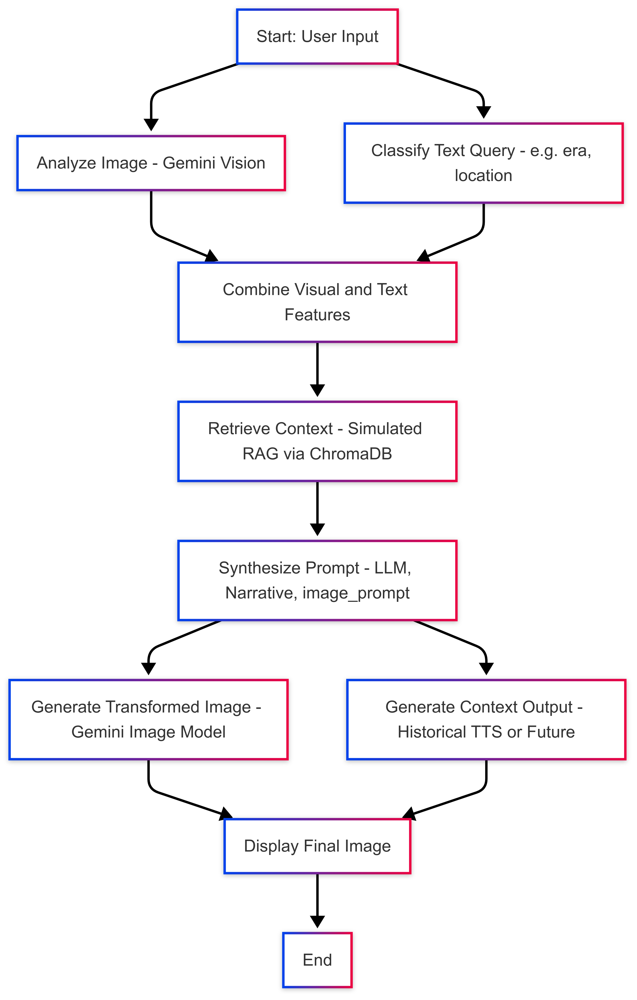

## 2. Setup

### **Goal:** Set up a robust environment for the project, ensuring seamless interaction with generative AI, audio processing, and vector search.

We install and configure all necessary libraries and APIs, including tools for image processing, audio generation, and AI interaction. The setup ensures fault tolerance and smooth execution of the pipeline.

In [8]:
!pip uninstall -qyy jupyterlab
!pip install -q gTTS
!pip install -qU "google-genai==1.7.0" "chromadb==0.6.3" langchain sentence_transformers faiss-cpu google-generativeai Pillow gTTS

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.7/144.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.1/611.1 kB 13.8 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 42.7 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.7/345.7 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.7/30.7 MB 53.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.4/155.4 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 84.3 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.9/100.9 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28

### Imports and Global Setup

In [123]:
from google import genai
from google.genai import types
from gtts import gTTS
from PIL import Image as PILImage
from IPython.display import display, Image, Markdown, Audio
import io
import re
import json
import time
import datetime
genai.__version__

'0.8.0'

###  Setting API Key

In [124]:
# Getting API Key
from kaggle_secrets import UserSecretsClient

GOOGLE_API_KEY = UserSecretsClient().get_secret("GOOGLE_API_KEY")
client = genai.Client(api_key=GOOGLE_API_KEY)

In [125]:
# Retry Setup for Fault Tolerance
from google.api_core import retry
is_retriable = lambda e: (isinstance(e, genai.errors.APIError) and e.code in {429, 503})
genai.models.Models.generate_content = retry.Retry(predicate=is_retriable)(genai.models.Models.generate_content)

## 3. Knowledge Base Definition

**Goal:** Define a curated source of contextual information to support the RAG system.

I created a metadata-driven knowledge base using Google AI Studio. It consists of a dictionary with key locations/eras, people, and objects, each paired with detailed descriptions and relevant keywords to guide the AI's context retrieval.

In [126]:
print("Defining Simulated Knowledge Base (for RAG)...")
documents = {

    # --- LOCATIONS: Specific World Streets/Areas (PAST: 1800-2020) ---
    "street_nyc_times_square_1910s": {
        "description": "Location: Times Square, New York City. Era: 1910s. Description: Known as Longacre Square. Early large electric billboards ('The Great White Way'), promoting theatre and vaudeville. Less densely built than later eras. Streets bustling with early automobiles (Ford Model T), horse-drawn carriages, electric streetcars. Pedestrians in formal Edwardian attire. Atmosphere of emerging mass entertainment and early advertising.",
        "keywords": ["times square", "new york city", "nyc", "1910s", "longacre square", "early billboards", "streetcar", "edwardian", "theatre district", "manhattan"]
    },
    "street_nyc_times_square_1970s": {
        "description": "Location: Times Square, New York City. Era: 1970s. Description: Known for its gritty, somewhat seedy atmosphere. Abundance of movie theaters (often showing grindhouse/adult films), large flashing neon signs, billboards. Streets filled with large, boxy American cars (yellow cabs prominent), buses. Diverse crowds reflecting 70s fashion (bell bottoms, platform shoes). Atmosphere of urban decay mixed with vibrant, slightly dangerous nightlife.",
        "keywords": ["times square", "new york city", "nyc", "1970s", "gritty", "neon signs", "yellow cab", "70s fashion", "urban decay", "movie theater", "manhattan"]
    },
    "street_nyc_wall_street_1920s": {
        "description": "Location: Wall Street, New York City. Era: 1920s (Roaring Twenties). Description: Financial district hub. Relatively narrow street flanked by imposing stone buildings in Neoclassical or Gothic Revival styles (e.g., NYSE building). Busy during trading hours with businessmen in suits and hats, ticker tape potentially visible. Vintage cars parked along curbs. Atmosphere of financial power, ambition, pre-crash prosperity.",
        "keywords": ["wall street", "new york city", "nyc", "1920s", "financial district", "stock exchange", "neoclassical architecture", "vintage car", "businessman", "manhattan"]
    },
    "street_paris_champs_elysees_1890s": {
        "description": "Location: Champs-Élysées, Paris, France. Era: 1890s (Belle Époque). Description: Wide, grand avenue lined with trees, elegant Haussmannian buildings with ornate balconies. Luxurious horse-drawn carriages (calèches), early automobiles ('horseless carriages'). Fashionable pedestrians strolling (women in long dresses with corsets, men in suits/top hats). Gas street lamps casting a warm glow. View towards Arc de Triomphe. Atmosphere of elegance, leisure, Parisian high society.",
        "keywords": ["champs elysees", "paris", "france", "1890s", "belle epoque", "haussmannian", "horse carriage", "arc de triomphe", "fashionable", "gas lamp"]
    },
    "street_paris_montmartre_1950s": {
        "description": "Location: Montmartre district, Paris, France. Era: 1950s. Description: Picturesque, bohemian neighborhood known for artists. Narrow, winding cobblestone streets, often steep stairs. Smaller buildings housing cafes with outdoor seating, artist studios, cabarets (like Moulin Rouge nearby). Sacré-Cœur Basilica prominent on the hill. Fewer cars than main avenues, perhaps Citroën 2CVs or Renault 4CVs. Atmosphere retains artistic charm, post-war feel, slightly less polished than central Paris.",
        "keywords": ["montmartre", "paris", "france", "1950s", "cobblestone", "bohemian", "artists", "sacre coeur", "cafe", "citroen 2cv", "moulin rouge"]
    },
    "street_rome_colosseum_area_1900s": {
        "description": "Location: Area around Colosseum, Rome, Italy. Era: Early 1900s. Description: The ancient Colosseum structure stands prominently, showing signs of age and partial ruin. Surrounding area is less excavated and organized than today, with dirt or roughly paved roads. Horse-drawn carts, electric trams, pedestrians are common. Some early 20th-century residential buildings visible nearby, alongside other ancient ruins like the Roman Forum. Atmosphere of ancient history meeting the emerging modern city.",
        "keywords": ["rome", "colosseum", "roman forum", "italy", "1900s", "ancient ruins", "horse cart", "tram", "historic"]
    },
    "street_florence_ponte_vecchio_1960s": {
        "description": "Location: Ponte Vecchio bridge, Florence, Italy. Era: 1960s. Description: Famous medieval stone bridge spanning the Arno River. Lined with small shops (jewelers, art dealers, souvenir sellers) built directly onto the bridge structure. Bustling with pedestrian traffic, tourists mingling with locals. Fashion reflects the early 1960s 'La Dolce Vita' era. Vespas scooters likely visible on nearby streets. Atmosphere of historical charm, Renaissance architecture, vibrant tourism, Italian style.",
        "keywords": ["florence", "firenze", "ponte vecchio", "italy", "1960s", "arno river", "medieval bridge", "vespa", "tourism", "renaissance"]
    },
    "street_london_fleet_street_1880s": {
        "description": "Location: Fleet Street, London, UK. Era: 1880s (High Victorian). Description: Known as the heart of London's newspaper and printing industry. Relatively narrow, crowded street, often depicted as foggy or smoggy due to coal pollution. Dominated by horse-drawn traffic: double-decker omnibuses, hansom cabs, delivery wagons. Numerous signs for newspapers (The Times, Daily Telegraph), printers, pubs. Pedestrians in typical Victorian attire. Gas lamps provide street lighting. Atmosphere of bustling commerce, printing presses, newsprint, dense urban Victorian life.",
        "keywords": ["fleet street", "london", "uk", "1880s", "victorian", "newspaper", "printing", "horse bus", "hansom cab", "foggy", "gas lamp", "smog"]
    },
    "street_auckland_queen_street_2000s": {
        "description": "Location: Queen Street, Auckland, New Zealand. Era: 2000s (Decade). Description: Main commercial and retail thoroughfare in Auckland CBD. Mix of historical colonial-era buildings and more modern (late 20th C / early 21st C) office towers and retail complexes. City buses, cars typical of the 2000s (Japanese imports common). Pedestrians in contemporary casual or business attire. Signage for international and local brands. Generally clean, modern harbour city atmosphere.",
        "keywords": ["queen street", "auckland", "new zealand", "nz", "2000s", "commercial street", "modern city", "harbour", "cbd"]
    },
    # --- LOCATIONS: Specific Indian Streets/Areas (PAST: 1800-2020) ---
    "street_mumbai_fort_area_1900s": {
        "description": "Location: Fort Area, Mumbai (Bombay), India. Era: Early 1900s (British Raj). Description: City's financial and administrative heart. Characterized by grand colonial architecture in Victorian Gothic and Indo-Saracenic styles (e.g., CSMT Station, Mumbai University, High Court). Wide streets compared to older parts of the city. Transportation mix: Horse-drawn carriages (Victorias), early motor cars, electric trams, hand-pulled rickshaws. Population mix includes British officials, Indian businessmen, clerks, laborers in period attire (dhoti, kurta, sari, suits). Atmosphere of imperial power, established commerce, architectural grandeur.",
        "keywords": ["fort area", "mumbai", "bombay", "india", "1900s", "british raj", "colonial architecture", "victorian gothic", "indo-saracenic", "tram", "csmt"]
    },
    "street_mumbai_marine_drive_1960s": {
        "description": "Location: Marine Drive, Mumbai (Bombay), India. Era: 1960s. Description: Famous C-shaped promenade along Back Bay, known as the 'Queen's Necklace' at night due to streetlights. Lined with distinctive Art Deco apartment buildings (mostly built 1930s-40s). Fewer skyscrapers than today. Road traffic includes cars typical of 60s India (Ambassadors, Fiats, Premier Padmini), double-decker buses. Families and couples strolling along the wide sea-facing pavement. Less crowded than modern times. Atmosphere of seaside leisure, relatively open space, distinctive architecture.",
        "keywords": ["marine drive", "mumbai", "bombay", "india", "1960s", "art deco", "sea face", "promenade", "queens necklace", "ambassador car", "fiat car", "padmini"]
    },
    "street_delhi_chandni_chowk_1850s": {
        "description": "Location: Chandni Chowk, Old Delhi, India. Era: 1850s (Late Mughal / Pre-1857). Description: Major historical market street, heart of Shahjahanabad. Extremely crowded, bustling, and potentially chaotic. Narrow main street with even narrower lanes (gullies) branching off. Lined with traditional shops (textiles, spices, jewelry, sweets, books). Mughal-era architecture visible (havelis with intricate facades, mosques like Jama Masjid nearby). Transportation: Bullock carts, elephants carrying nobles, palanquins, horse riders, dense pedestrian traffic. Diverse population reflecting the late Mughal capital. Atmosphere of vibrant, traditional commerce, pre-colonial North Indian city life.",
        "keywords": ["chandni chowk", "old delhi", "delhi", "india", "1850s", "mughal era", "shahjahanabad", "market", "crowded", "bullock cart", "haveli", "jama masjid"]
    },
    "street_delhi_connaught_place_1950s": {
        "description": "Location: Connaught Place (Rajiv Chowk), New Delhi, India. Era: 1950s (Post-Independence). Description: Circular commercial hub designed by Lutyens (completed 1930s). Distinctive Georgian architecture with white colonnaded buildings forming two concentric circles (Inner and Outer Circle). Relatively wide roads, significantly less traffic than today. Cars include Hindustan Ambassadors, Fiats, maybe some imported models. People in early post-independence attire (saris, kurta-pajamas, trousers/shirts, officials in suits). Fewer large brand signs compared to later decades, perhaps signs for cinemas or early Indian companies. Atmosphere reflects the capital of a newly independent nation, planned elegance, sense of formality.",
        "keywords": ["connaught place", "rajiv chowk", "new delhi", "delhi", "india", "1950s", "lutyens delhi", "georgian architecture", "colonnade", "ambassador car", "post independence"]
    },
     "street_chennai_mount_road_1930s": {
        "description": "Location: Mount Road (Anna Salai), Chennai (Madras), India. Era: 1930s (British Raj). Description: Major arterial road, center of colonial Madras. Features prominent colonial-era institutions, shops, and businesses housed in buildings often in Indo-Saracenic or emerging Art Deco styles (e.g., Higginbotham's bookstore, Spencers building, early LIC building). Electric trams running along the road. Traffic mix includes early motor cars, bicycles, bullock carts, hand-carts, and pedestrians. Some sections might be less built-up compared to today. Atmosphere of a major administrative and commercial center in British South India.",
        "keywords": ["mount road", "anna salai", "chennai", "madras", "india", "1930s", "british raj", "colonial architecture", "indo-saracenic", "art deco", "tram", "higginbothams"]
    },
    "street_hyderabad_charminar_area_1910s": {
        "description": "Location: Area around Charminar, Hyderabad, India. Era: 1910s (Nizam's rule). Description: The iconic Charminar monument (built 1591) stands central. The area is a bustling, traditional market zone. Laad Bazaar, famous for bangles and pearls, is located nearby. Predominantly Islamic and Indo-Islamic architectural styles. Streets filled with horse-drawn carriages (tongas, Victorias), bullock carts, pedestrians in traditional Hyderabadi attire (sherwanis, kurtas, pyjamas, elaborate saris, burqas). Atmosphere of a historic capital of a wealthy princely state, vibrant traditional markets, strong cultural identity.",
        "keywords": ["charminar", "hyderabad", "india", "1910s", "nizam", "laad bazaar", "islamic architecture", "princely state", "bangles", "pearls", "tonga"]
    },
    # --- LOCATIONS: Generic Types (PAST: 1800-2020) ---
    "house_victorian_generic_1900s": {
        "description": "Location: Generic UK/USA/Commonwealth town/suburb. Era: 1900s (Late Victorian/Edwardian). Description: Architectural style possibly transitioning from high Victorian Queen Anne towards simpler Arts and Crafts or Colonial Revival influences. Still likely features wood construction, prominent porch, perhaps a bay window, but with less complex massing and potentially less ornate 'gingerbread' trim than 1880s examples. Gas lighting being actively replaced by early electric wiring (knob-and-tube visible in interiors/attics). Roads might be better paved (macadam). Early automobiles appearing alongside horse-drawn vehicles.",
        "keywords": ["victorian house", "edwardian house", "house", "home", "residence", "1900s", "queen anne", "arts and crafts", "porch", "early electric light", "early automobile"]
    },
    "street_urban_generic_1950s": {
        "description": "Location: Generic Western city/town street (USA focus). Era: 1950s. Description: Wider streets accommodate increased car traffic. American cars with chrome details and tailfins are prominent. Architecture includes mid-century modern elements (clean lines, large windows) in newer buildings or shops, alongside older styles. Appearance of early supermarkets, motels, drive-in theaters or restaurants. People in typical 50s fashion (full skirts/dresses for women, shirts/slacks/jackets for men). Overhead power and telephone lines common. Atmosphere of post-war economic boom, consumerism, growing car culture.",
        "keywords": ["urban street", "suburb", "town", "city", "1950s", "american car", "tailfins", "mid-century modern", "drive-in", "consumerism", "chrome"]
    },
    "street_rural_generic_1920s": {
        "description": "Location: Generic countryside road (Europe/North America). Era: 1920s. Description: Often unpaved dirt or gravel roads, potentially muddy. Lined with wooden fences, fields, scattered trees. Simple wooden farmhouses and barns visible in the distance or roadside. Maybe a small, isolated village center with a general store or post office. Transportation: Horse-drawn wagons still very common for farming/local transport, early tractors appearing, some Ford Model T or similar basic cars. Fewer people visible. Early telephone lines on wooden poles might be present. Atmosphere of agriculture, relative isolation, slower pace of life compared to cities.",
        "keywords": ["rural road", "countryside", "farm", "1920s", "dirt road", "gravel road", "farmhouse", "barn", "model t", "horse wagon", "agriculture", "telephone pole"]
    },
    "office_generic_1980s":{
        "description": "Location: Generic office building interior. Era: 1980s. Description: Workspace often characterized by rows of cubicles with fabric-covered partitions. Dominated by bulky CRT monitors (often monochrome green or amber text displays) and beige desktop computers (like IBM PC/XT/AT, early Apple Macintosh). Keyboards are typically large and clicky. Landline telephones with coiled cords are ubiquitous. Noise from dot matrix printers common. Fluorescent lighting overhead. Office attire often includes 'power suits' with shoulder pads for women, wider ties and suits for men. Early fax machines might be present. Atmosphere of early corporate computing, pre-internet ubiquity.",
        "keywords": ["office interior", "workplace", "1980s", "crt monitor", "beige computer", "cubicle", "landline phone", "dot matrix printer", "power suit", "ibm pc", "macintosh"]
    },
    "internet_cafe_1990s": {
        "description": "Location: Generic town/city storefront. Era: Late 1990s. Description: Small commercial establishment providing public access to the internet, often charged by the hour. Filled with multiple desktop computers, typically beige towers with CRT monitors, running Windows 95/98. Users browsing early websites, using chat programs (ICQ, AIM), or playing early online games. Sounds of dial-up modems connecting might be implied. Posters for Internet Service Providers (AOL, CompuServe, local ISPs) or popular websites/games visible. Basic furniture, often somewhat dimly lit. Atmosphere of the early, exciting era of public internet accessibility.",
        "keywords": ["internet cafe", "cybercafe", "1990s", "crt monitor", "desktop computer", "dial-up", "public internet", "aol", "windows 95", "windows 98", "web browsing"]
    },
   # --- PEOPLE Archetypes (PAST: 1800-2020) ---
    "person_industrial_worker_uk_1890s": {
        "description": "Subject: Person Archetype. Location Context: UK industrial town (Manchester, Liverpool etc.). Era: 1890s. Description: Working-class male. Attire: Heavy, durable, often soot-stained or dirty clothes appropriate for manual labor - typical includes a flat cloth cap, collarless shirt, waistcoat (vest), sturdy trousers (e.g., moleskin), heavy work boots. May carry tools or a simple lunch pail. Context: Employed in factories (textile mills), coal mines, docks, or foundries. Associated with long working hours, often poor and dangerous conditions, industrial pollution (smog), noise of machinery.",
        "keywords": ["industrial worker", "factory worker", "miner", "working class", "uk", "1890s", "victorian era", "cloth cap", "waistcoat", "work boots", "manual labor", "smog"]
    },
    "person_suffragette_uk_1910s": {
        "description": "Subject: Person Archetype. Location Context: UK cities (esp. London). Era: 1910s. Description: Woman actively campaigning for women's right to vote (suffrage). Attire: Often dressed in respectable Edwardian fashion (long skirts, high-necked blouses, tailored jackets, hats) to counter negative stereotypes, but distinguished by wearing sashes, rosettes, or badges in the Women's Social and Political Union (WSPU) colours (purple, white, green). Context: Seen participating in public demonstrations, marches, rallies, possibly handing out leaflets or engaging in acts of civil disobedience (protests, heckling). Associated with political activism, challenging traditional gender roles, fighting for equality.",
        "keywords": ["suffragette", "uk", "1910s", "edwardian", "womens suffrage", "wspu", "protest", "activist", "votes for women", "purple white green"]
    },
    "person_hippie_usa_1960s": {
        "description": "Subject: Person Archetype. Location Context: USA (esp. San Francisco/California). Era: Late 1960s (around 1967-1969). Description: Member of the youth counter-culture movement. Attire: Rejects mainstream fashion. Features colorful, often handmade or ethnic-inspired clothing - tie-dye shirts, bell-bottom jeans, peasant blouses, fringed vests, maxi dresses, sandals or barefoot. Long, unkempt hair common for both sexes, often adorned with flowers or headbands. Accessories: Peace symbols, beads, bandanas. Context: Associated with the anti-Vietnam War peace movement, psychedelic rock music, alternative spiritualities, communal living, 'flower power'.",
        "keywords": ["hippie", "hippy", "usa", "california", "1960s", "counter culture", "tie-dye", "bell bottoms", "peace symbol", "long hair", "psychedelic", "flower power", "anti-war"]
    },
    "person_punk_uk_1980s": {
        "description": "Subject: Person Archetype. Location Context: UK cities (London, Manchester). Era: Early 1980s (evolved from late 70s). Description: Member of the punk subculture, expressing rebellion and anti-establishment views. Attire: Deliberately provocative and DIY - ripped clothing often held together by safety pins, leather jackets adorned with studs/paint/band patches, band t-shirts (e.g., Sex Pistols, The Clash), tartan patterns (especially bondage trousers). Hair: Often dyed bright, unnatural colours (pink, green), styled into Mohawks, spikes, or liberty spikes. Accessories: Chains, safety pins used as jewelry, studded belts/bracelets, heavy combat boots (e.g., Dr. Martens). Context: Associated with punk rock music, anarchism, confronting societal norms, DIY ethos.",
        "keywords": ["punk", "punk rocker", "uk", "1980s", "subculture", "ripped clothes", "leather jacket", "mohawk", "safety pins", "tartan", "bondage trousers", "dr martens", "punk rock", "anti-establishment"]
    },
     "person_tech_worker_usa_2010s": {
        "description": "Subject: Person Archetype. Location Context: USA (esp. Silicon Valley, Seattle, tech hubs). Era: 2010s. Description: Young adult (typically 20s-30s) working in the technology industry (software engineering, product management, design etc.). Attire: Very casual, often described as 'nerd chic' or 'startup casual' - jeans or chinos, graphic t-shirt (often with company logo, pop culture reference, or witty slogan), hoodie or fleece jacket, sneakers or casual shoes. May carry a laptop backpack. Often seen looking at a smartphone or laptop. Context: Works at a tech startup or large tech corporation (Google, Facebook, etc.). Associated with software development, agile methodologies, open office plans, long hours, potentially high salaries.",
        "keywords": ["tech worker", "software engineer", "developer", "silicon valley", "usa", "2010s", "startup", "casual wear", "hoodie", "laptop", "smartphone", "google", "facebook"]
    },
    # --- OBJECTS / CONCEPTS (PAST: 1800-2020) ---
    "object_horse_drawn_carriage_1880s": {
        "description": "Object: Transportation Vehicle. Era Context: Dominant form before automobiles, common 1880s. Description: A wheeled vehicle pulled by one or more horses. Wide variety of types: elegant closed broughams or landaus for the wealthy, practical open-topped hansom cabs for taxi service, large double-decker omnibuses for urban public transport, simple two-wheeled carts for goods or rural use. Typically features wooden construction, large spoked wheels (often wooden with iron rims), seating for passengers/driver, harness connecting to horse(s). Used on city streets (cobblestone/macadam) and country roads (dirt/gravel).",
        "keywords": ["horse drawn carriage", "horse cart", "hansom cab", "omnibus", "brougham", "1880s", "victorian transport", "wooden wheel", "horse", "buggy"]
    },
     "object_model_t_car_1910s": {
        "description": "Object: Transportation Vehicle. Era Context: Produced 1908-1927, ubiquitous in 1910s/early 20s. Description: Early mass-produced automobile by Ford Motor Company, credited with 'putting the world on wheels'. Distinctive visual features: often painted black ('any color so long as it's black'), high ground clearance for poor roads, exposed engine components initially, prominent brass radiator (early models), simple open-top (touring) or closed (sedan) body styles, thin spoked wheels with pneumatic tires. Relatively slow by modern standards. Known for its affordability and mechanical simplicity (for the time).",
        "keywords": ["model t", "ford", "tin lizzie", "vintage car", "automobile", "car", "1910s", "brass radiator", "mass production", "spoked wheels"]
    },
    "object_rotary_phone_1950s": {
        "description": "Object: Communication Device. Era Context: Standard telephone technology mid-20th C, common 1950s. Description: Landline telephone featuring a rotary dial mechanism on the front. To place a call, the user inserts a finger into the numbered hole on the dial and rotates it to the finger stop for each digit. Typically made of heavy thermoset plastic (like Bakelite in earlier models) or later thermoplastics. Common colors included black, ivory, and later various pastels (pink, turquoise). Included a handset (receiver and transmitter) connected by a coiled cord to the base unit, which was wired to the wall jack.",
        "keywords": ["rotary phone", "telephone", "landline", "1950s", "finger dial", "rotary dial", "bakelite", "communication", "phone call", "vintage tech"]
    },
    "object_personal_computer_1980s": {
        "description": "Object: Technology Device. Era Context: Rise of home/personal computing in the 1980s. Description: Early desktop computer system designed for individual use. Typically consists of several separate components: a main system unit (often a beige or off-white horizontal or tower box) containing the CPU/motherboard/drives, a bulky Cathode Ray Tube (CRT) monitor (often displaying monochrome green or amber text, or low-resolution CGA/EGA color graphics), a keyboard (often large, mechanical, 'clicky'), and sometimes a mouse (less common early on). Primary storage via floppy disk drives (5.25-inch or 3.5-inch). Common models: IBM PC/XT/AT, Apple II series, Commodore 64/Amiga, early Apple Macintosh.",
        "keywords": ["personal computer", "pc", "desktop computer", "home computer", "1980s", "crt monitor", "beige box", "floppy disk", "keyboard", "ibm pc", "apple ii", "commodore 64", "macintosh", "vintage tech"]
    },
    "object_smartphone_2010s": {
        "description": "Object: Technology/Communication Device. Era Context: Dominant mobile technology of the 2010s. Description: Handheld mobile device integrating phone calls, messaging, internet access, apps, camera, media playback. Characterized by a large capacitive touchscreen interface covering most of the front surface. Rectangular 'slab' form factor, typically with glass front and metal/plastic back. Physical buttons minimal (power, volume, maybe home button). Examples defining the era include Apple iPhone 4 through iPhone X, Samsung Galaxy S series (S2-S10), Google Nexus/Pixel phones. App stores (iOS App Store, Google Play) central to functionality. Less 'bezel-less' screen designs compared to late 2010s/2020s.",
        "keywords": ["smartphone", "mobile phone", "cell phone", "2010s", "touchscreen", "iphone", "android", "samsung galaxy", "google pixel", "apps", "app store", "mobile internet"]
    },
    # --- LOCATIONS (FUTURE: 2030-2070) ---
    "street_nyc_times_square_2040s": {
        "description": "Location: Times Square, NYC. Era: Near Future (2040s). Description: Increased density of visual information. Billboards likely evolved into massive, high-resolution, possibly 3D or holographic displays seamlessly integrated into building facades, showing highly personalized/interactive advertising. Autonomous electric vehicles (shared pods or private cars) navigate designated lanes, possibly with integrated traffic management systems. Pedestrian areas might be expanded, potentially with dynamic surfaces or AR integration points. Drone activity (delivery, surveillance, news) visible overhead. Atmosphere of hyper-commercialism, constant data streams, advanced but potentially overwhelming sensory input.",
        "keywords": ["times square", "new york city", "nyc", "2040s", "futuristic", "holographic ads", "3d billboard", "autonomous vehicle", "electric vehicle", "drone", "augmented reality", "hyper commercial", "manhattan"]
    },
     "street_mumbai_bandra_worli_sea_link_area_2050s": {
        "description": "Location: Area near Bandra-Worli Sea Link, Mumbai, India. Era: Mid-Future (2050s). Description: The iconic cable-stayed bridge remains a central feature. Surrounding coastline likely features advanced climate adaptation infrastructure - significantly higher, potentially multi-functional sea walls or integrated barriers due to sea-level rise. Mix of existing 21st-century high-rises and newer 'smart' buildings incorporating green tech (vertical farms, kinetic facades, atmospheric water generators). Advanced electric and autonomous vehicles dominate traffic. Significant drone traffic for logistics and potentially passenger transport ('air taxis'). Air quality might be managed by localized purification tech. Atmosphere of a dynamic, adapting megacity facing climate change head-on.",
        "keywords": ["mumbai", "india", "bandra worli sea link", "2050s", "futuristic", "sea level rise adaptation", "smart building", "green tech", "autonomous vehicle", "drone", "air taxi", "megacity", "climate change"]
    },
    "street_generic_urban_2060s": {
        "description": "Location: Generic advanced city (global concept). Era: Mid-Future (2060s). Description: Highly integrated and multi-layered urban environment. Increased verticality is key: dedicated multi-level transport corridors (ground EVs, mid-level pods, upper-level drones/VTOLs), skybridges connecting buildings. Building facades are adaptive ('smart skins' changing color/opacity, displaying info, generating energy), extensive integration of vertical farms or algae bioreactors for local food/air processing. Drone superhighways are common. Personalized autonomous transport pods ubiquitous. Public spaces feature interactive holographic elements, responsive surfaces. Clear signs of advanced climate mitigation/adaptation technology. Atmosphere of high efficiency, data saturation, potential loss of traditional street-level chaos.",
        "keywords": ["urban street", "futuristic city", "advanced city", "2060s", "vertical farming", "autonomous pod", "drone highway", "vtol", "holographic", "climate adaptation", "smart building", "multi-level transport"]
    },
     "house_generic_smart_home_2070s": {
        "description": "Location: Generic residential interior. Era: Further Future (2070s). Description: Represents peak smart home integration and sustainability. Highly minimalist aesthetic with adaptable, multi-functional spaces (walls/furniture reconfigure programmatically). Wall surfaces are likely high-resolution displays or e-ink, capable of changing appearance or showing information seamlessly. AI assistant is deeply integrated, potentially ambient, controlling lighting, climate, security, information flow via voice or contextual awareness. Furniture might be 3D printed on demand or highly modular. Advanced closed-loop hydroponics/aeroponics for significant indoor food production. Focus on net-zero energy, advanced recycling, personalized environment control. Connection to external networks is ubiquitous.",
        "keywords": ["smart home", "futuristic interior", "residence", "home", "2070s", "ai assistant", "minimalist", "adaptable space", "hydroponics", "aeroponics", "net zero energy", "display wall", "3d printed furniture"]
    },
    # --- PEOPLE Archetypes (FUTURE: 2030-2070) ---
    "person_ar_designer_2040s": {
        "description": "Subject: Person Archetype. Era Context: Near Future (2040s). Description: Professional specializing in creating Augmented Reality experiences and interfaces. Attire likely stylish but functional 'tech-casual', possibly incorporating smart fabrics or subtle integrated displays. Often seen wearing lightweight, fashionable AR glasses or advanced contact lenses providing virtual overlays. Interacting with holographic interfaces or virtual objects via precise hand gestures, voice commands, or potentially neural interfaces (implied). Context: Works in creative technology, advertising, education, or industrial design sectors, shaping the virtual layer overlaid onto the real world.",
        "keywords": ["ar designer", "augmented reality", "xr designer", "2040s", "futuristic", "ar glasses", "holographic interface", "gestural control", "creative tech", "virtual overlay"]
    },
    "person_urban_drone_operator_2050s": {
        "description": "Subject: Person Archetype. Era Context: Mid-Future (2050s). Description: Skilled worker responsible for managing and coordinating fleets of autonomous drones used for various urban tasks (logistics/delivery, infrastructure inspection, security surveillance, emergency response). Might wear a standardized uniform for a logistics company or city service, or practical workwear featuring integrated communication devices, heads-up displays (in glasses/helmet), or specialized controllers (tablet or wearable). Could be operating remotely from a central control center, or potentially mobile within the city overseeing local operations.",
        "keywords": ["drone operator", "drone pilot", "urban logistics", "surveillance", "2050s", "futuristic", "autonomous drone", "control center", "delivery drone", "uniform"]
    },
     "person_climate_adaption_specialist_2070s": {
        "description": "Subject: Person Archetype. Era Context: Further Future (2070s). Description: Highly specialized expert focused on designing, implementing, or managing solutions to mitigate and adapt to significant climate change impacts. Might be shown outdoors in demanding environments, wearing advanced protective gear (climate-controlled suits, respirators, flood gear) suitable for extreme heat, storms, or poor air quality. Could be working on large-scale geoengineering projects, managing advanced sea walls, overseeing resilient agriculture systems (vertical farms, drought-resistant crops), or operating atmospheric carbon capture technology. Carries advanced environmental monitoring and diagnostic equipment.",
        "keywords": ["climate adaptation specialist", "climate change", "environmental engineer", "geoengineering", "2070s", "futuristic", "protective gear", "resilience", "sea wall", "carbon capture", "monitoring equipment"]
    },
    # --- OBJECTS / CONCEPTS (FUTURE: 2030-2070) ---
     "object_autonomous_ev_pod_2050s": {
        "description": "Object: Transportation Vehicle. Era Context: Common urban transport mid-future (2050s). Description: Small, likely electric, and fully autonomous (Level 5) vehicle optimized for dense urban environments. Often pod-shaped or compact, prioritizing interior space over traditional car layout. No visible driver controls (steering wheel, pedals). Large glass areas or screen-based windows for passenger visibility or entertainment/information display. Designed primarily for shared mobility services (robotaxi) or short-distance personal transport within integrated smart city networks. Features sleek, aerodynamic design focused on efficiency.",
        "keywords": ["autonomous vehicle", "electric vehicle", "ev pod", "robotaxi", "shared mobility", "2050s", "futuristic transport", "smart city", "level 5 autonomy", "pod car"]
    },
    "object_holographic_interface_2060s": {
        "description": "Object: Technology Interface Type. Era Context: Advanced interface technology (2060s). Description: A user interface projected into three-dimensional space, appearing as a free-floating image or interactive elements that users can manipulate via gestures, voice, or potentially neural input. Can range from small personal displays projected from wearables to large room-scale installations. Used for communication, data visualization, design work, entertainment. May have visible light projection source or appear more seamless. Often depicted with a slight transparency or characteristic blue/cyan glow.",
        "keywords": ["holographic interface", "hologram", "3d display", "user interface", "ui", "ux", "2060s", "futuristic technology", "gestural control", "data visualization", "augmented reality"]
    },
}
# historical_knowledge_base = documents
print(f"Simulated Knowledge Base populated with {len(documents)} entries.")

Defining Simulated Knowledge Base (for RAG)...
Simulated Knowledge Base populated with 39 entries.


## 4. Image Understanding

**Goal:** Extract key details and visual characteristics from the input image.

Uses the Gemini vision model to analyze the image and extract semantic information. This helps guide the transformation process and retrieve relevant context for RAG.

In [141]:
import os

# --- Image Analysis Function ---
def analyze_input_image(image_path: str):
    try:
        if not os.path.exists(image_path):
            print(f"Error: Image path '{image_path}' does not exist.")
            return None
        with open(image_path, "rb") as f:
            image_bytes = f.read()

        pil_image = PILImage.open(io.BytesIO(image_bytes)).convert("RGB")
        pil_image.thumbnail((512, 512))  
        # Gemini structured image analysis prompt
        structured_prompt = """
Analyze the provided image. Extract the following details concisely:

1. **Concise Description:** Briefly describe the main subject(s), setting (e.g., day/night, weather), key visible features, and overall atmosphere.
2. **Key Elements List:** List prominent objects or elements visible.
3. **Primary Subject Type:** Classify the main subject.
4. **Style/Artistic Hints:** Mention any discernible artistic or photographic style.
5. **Keywords for Retrieval (RAG):** Provide 2-4 specific keywords optimized for searching the knowledge base.
"""
        response = client.models.generate_content(
            model="gemini-2.0-flash",
            config=types.GenerateContentConfig(
                response_modalities=["text"]
            ),
            contents=[
                types.Content(role="user", parts=[types.Part(text=structured_prompt)]),
                types.Content(role="user", parts=[types.Part(
                    inline_data=types.Blob(mime_type="image/jpeg", data=image_bytes)
                )])
            ]
        )
        response_text = response.candidates[0].content.parts[0].text.strip()
        return parse_analysis_output(response_text)
    except Exception as e:
        print(f"Error analyzing image: {e}")
        return None

# --- Output Parsing Function ---
def parse_analysis_output(response_text: str):
    fields = {
        "description": r"\*\*Concise Description:\*\*\s*(.*)",
        "elements": r"\*\*Key Elements List:\*\*\s*(.*)",
        "subject_type": r"\*\*Primary Subject Type:\*\*\s*(.*)",
        "style_hints": r"\*\*Style/Artistic Hints:\*\*\s*(.*)",
        "keywords_rag": r"\*\*Keywords for Retrieval \(RAG\):\*\*\s*(.*)"
    }
    result = {}
    for key, pattern in fields.items():
        match = re.search(pattern, response_text, re.IGNORECASE)
        if match:
            result[key] = match.group(1).strip()
    raw_keywords = result.get("keywords_rag", "")
    cleaned_keywords = re.sub(r'[\"\'\*\-]', '', raw_keywords)
    keyword_list = [
        kw.strip().lower().replace(" ", "_")
        for kw in cleaned_keywords.split(",") if kw.strip()
    ]
    result["keywords_list"] = sorted(set(keyword_list))
    return result

## 5. Text Query Classification

**Goal:** Interpret the user's query to understand their intent regarding the target era, style, subject, and location.

- Uses predefined keyword lists for fast classification of era, style, subject, and location.
- If needed, falls back to a Gemini model for deeper analysis.
- Converts user input into structured parameters for the next steps.

This module ensures accurate interpretation of user queries to guide image generation.


In [142]:
import re
import json

# --- Predefined keyword lists -
eras = ["1700s", "1800s", "1900s", "1920s", "1950s", "1980s", "2000s", "2040s", "2050s", "Victorian", "Art Deco", "Modern", "Futuristic"]
styles = ["photorealistic", "oil painting", "watercolor", "sketch", "anime", "cyberpunk", "vintage", "black and white", "abstract", "surreal", "retro", "realistic"]
subjects = ["person", "portrait", "group of people", "landscape", "street scene", "city scene", "building", "iconic landmark", "object", "car", "animals"]
locations = ["New York", "London", "Paris", "Tokyo", "India", "Egypt", "Rome", "Berlin", "Mumbai", "Los Angeles", "California", "Japan", "China", "Russia"]
person_keywords = ["person", "man", "woman", "worker", "designer", "operator", "specialist", "gentleman", "lady", "suffragette", "hippie", "punk", "character", "figure", "individual", "boy", "girl", "child"]

# --- Main Classification Function ---
def classify_user_input(text_query: str):
    try:
        text_lower = text_query.lower() if text_query else ""
        extracted = {
            "era": match_regex(eras, text_query),
            "style": match_regex(styles, text_query),
            "subject": match_regex(subjects, text_query),
            "location": match_regex(locations, text_query),
            "subject_hint": "person" if any(pk in text_lower for pk in person_keywords) else "place"
        }
        if not any(extracted[key] for key in ["era", "style", "subject", "location"]):
            gemini_output = classify_user_input_with_gemini(text_query)
            extracted.update({k: gemini_output.get(k, extracted[k]) for k in ["era", "style", "subject", "location"]})

        if not extracted["era"]:
            extracted["era"] = "1950s" if extracted["subject_hint"] == "person" else "late 1800s"
        if not extracted["style"]:
            extracted["style"] = "realistic"
        return extracted

    except Exception as e:
        print(f"Error during classification: {e}")
        return None

# --- Regex Matching Utility ---
def match_regex(keyword_list, text_query, return_first=True):
    if not text_query:
        return None
    for keyword in keyword_list:
        if re.search(r"\b" + re.escape(keyword) + r"\b", text_query, re.IGNORECASE):
            return keyword
    return None

# --- Gemini Classification Fallback (NEW FORMAT) ---
def classify_user_input_with_gemini(text_query: str):
    prompt = f"""
Extract the following structured information from the input text:

Era: <era>
Style: <style>
Subject: <subject>
Location: <location>

Text: "{text_query}"
"""
    response = client.models.generate_content(
        model="gemini-2.0-flash",
        config=types.GenerateContentConfig(response_modalities=["text"]),
        contents=[types.Content(role="user", parts=[types.Part(text=prompt)])]
    )
    response_text = response.candidates[0].content.parts[0].text.strip()
    return parse_classification_output(response_text)

# --- Response Parsing ---
def parse_classification_output(response_text: str):
    result = {
        "era": extract_line_value("Era", response_text),
        "style": extract_line_value("Style", response_text),
        "subject": extract_line_value("Subject", response_text),
        "location": extract_line_value("Location", response_text),
    }
    return result

def extract_line_value(field, text):
    match = re.search(fr"{field}:\s*(.+)", text, re.IGNORECASE)
    return match.group(1).strip() if match else None

## 6. RAG & Context Retrieval

**Goal:** Retrieve relevant context based on the user's query and input image.

The RAG process combines the user's query and image analysis to retrieve context from a knowledge base using ChromaDB and embeddings. The process ensures that the system generates context-aware responses by querying the most relevant documents.

In [143]:
import chromadb
from google import genai
from google.genai import types
from google.api_core import retry

# Define the GeminiEmbeddingFunction
class GeminiEmbeddingFunction(chromadb.EmbeddingFunction):
    document_mode = True

    @retry.Retry(predicate=is_retriable)
    def __call__(self, input: chromadb.Documents) -> chromadb.Embeddings:
        if self.document_mode:
            embedding_task = "retrieval_document"
        else:
            embedding_task = "retrieval_query"

        # Generate embeddings for the documents using the Gemini API
        response = client.models.embed_content(
            model="models/text-embedding-004",
            contents=input,
            config=types.EmbedContentConfig(task_type=embedding_task),
        )
        
        return [e.values for e in response.embeddings]

# Setup ChromaDB and Embedding Function
DB_NAME = "Data"
embed_fn = GeminiEmbeddingFunction()

chroma_client = chromadb.Client()
db = chroma_client.get_or_create_collection(name=DB_NAME, embedding_function=embed_fn)

# --- Add Embeddings to ChromaDB ---
doc_texts = [v["description"] for v in documents.values()]  
doc_ids = [str(i) for i in range(len(doc_texts))]  
db.add(documents=doc_texts, ids=doc_ids)
print(f"Chroma DB loaded with {db.count()} documents.")

embed_fn.document_mode = False

def retrieve_simulated_context(user_input: str, image_path: str, chroma_collection):
    """
    Retrieves the most relevant document from the knowledge base using RAG, combining Gemini-based text classification
    and image analysis to form a semantic search query.
    """
    try:
        # --- Step 1: Classify the user text input ---
        classified_result = classify_user_input(user_input)
        print(f"Classified Result: {classified_result}")
        if not classified_result:
            return "Failed to classify the user input."

        era = classified_result.get("era", "")
        style = classified_result.get("style", "")
        subject = classified_result.get("subject", "")
        location = classified_result.get("location", "")
        
        # --- Step 2: Analyze the image ---
        image_analysis = analyze_input_image(image_path)
        if not image_analysis:
            print("Image analysis failed.")
            return None
        print(f"Image Analysis: {image_analysis}")  
        keywords_list = image_analysis.get("keywords_list", [])
        keywords_str = " ".join(keywords_list)

        # --- Step 3: Build final combined query ---
        combined_query = f"{subject} {location} {era} {style} {keywords_str}"
        print(f"Combined Query: {combined_query}")

        # --- Step 4: RAG-based retrieval from ChromaDB ---
        result = chroma_collection.query(query_texts=[combined_query], n_results=1)
        if not result or not result.get("documents") or not result["documents"][0]:
            return "No relevant document found for this query."

        all_passages = result["documents"][0]
        print(f"Retrieved {len(all_passages)} document(s) from DB.") 

        # --- Step 5: Build generation prompt with passage(s) ---
        prompt = f"""You are a helpful and informative AI that uses the given reference to describe the scenario in simple and engaging terms.
        Speak to a non-technical audience. If the passage is not relevant, you may ignore it.
        
        QUESTION: Describe a scene combining this user request: '{user_input}' and the image provided.
        """
        for passage in all_passages:
            clean_passage = passage.replace("\n", " ")
            prompt += f"PASSAGE: {clean_passage}\n"

        # --- Step 6: Generate final answer from Gemini using the new client format ---
        response = client.models.generate_content(
            model="gemini-2.0-flash", 
            config=types.GenerateContentConfig(response_modalities=["text"]),
            contents=[types.Content(role="user", parts=[types.Part(text=prompt)])]
        )
        final_output = response.candidates[0].content.parts[0].text.strip()
        print(f"Final Answer: {final_output}") 
        return final_output

    except Exception as e:
        print(f"Error during RAG process: {e}")
        return None

Chroma DB loaded with 39 documents.


In [144]:
db.peek(1)

{'ids': ['0'],
 'embeddings': array([[-1.74225308e-02,  2.70703901e-02,  2.38272697e-02,
         -2.39645205e-02, -1.05247193e-03,  2.14254297e-02,
          6.69214688e-03,  4.87973355e-02, -2.37650182e-02,
          8.68337899e-02,  9.06912517e-03,  1.26583071e-03,
          1.79044753e-02,  2.18464304e-02, -3.25860316e-03,
          3.18426825e-02, -2.04890091e-02,  2.80770734e-02,
         -5.59170134e-02,  1.15008792e-02,  4.19125557e-02,
         -1.74005330e-02,  5.74275553e-02, -8.00441951e-02,
         -3.59709025e-04,  3.91900092e-02, -4.87841060e-03,
          2.86011910e-03,  2.33167149e-02, -3.65352705e-02,
          2.04235874e-02,  8.35729539e-02,  4.18244712e-02,
         -1.93667077e-02, -1.51518118e-02,  7.12849246e-03,
         -7.88285863e-03,  1.26774702e-02,  1.48266172e-02,
         -9.57727283e-02, -6.55815154e-02,  3.33413444e-02,
         -4.91935760e-03,  5.16231023e-02, -5.31503931e-02,
         -6.46370798e-02,  6.51721284e-03, -1.26786558e-02,
         -3

## 7. Synthesizing the Image Prompt

**Goal:** Create a detailed text prompt for the image generation model using all gathered data.

The `generate_image_prompt` function combines the user's query, image analysis, and RAG context to form a detailed meta-prompt. This prompt is sent to the Gemini model, which returns a structured JSON with both a narrative and an optimized image description. The extracted image prompt is then stored for later use.

In [145]:
import json
import re
from google import genai
from google.genai import types
generated_prompt = None

def generate_image_prompt(user_input: str, image_path: str, db) -> str:
    """
    Generates a detailed image prompt by combining metadata, image analysis, and retrieved context.
    """
    global generated_prompt

    try:
        # Step 1: Retrieve RAG context
        retrieved_answer = retrieve_simulated_context(user_input, image_path, db)
        if not retrieved_answer:
            return "Failed to retrieve relevant context for image prompt generation."

        # Step 2: Classify user query
        classified_result = classify_user_input(user_input)
        era = classified_result.get("era", "")
        style = classified_result.get("style", "N/A")
        subject = classified_result.get("subject", "")
        location = classified_result.get("location", "")

        # Step 3: Analyze image
        image_analysis = analyze_input_image(image_path)
        if not image_analysis:
            return "Image analysis failed. Cannot generate detailed prompt."
        image_desc = " ".join(image_analysis.get("keywords_list", []))

        # Step 4: Create LLM prompt for generation
        llm_prompt_generation_prompt = f"""
        You are an advanced AI that synthesizes historical and visual information to generate prompts for image generation models.
        You are provided with:
        - A user query
        - Structured metadata (era, style, subject, location)
        - Visual description of the uploaded image
        - Retrieved historical or stylistic context
        
        Your task:
        1. Write a short narrative (2-3 paragraphs) that immerses the viewer in the scene.
        2. Create a vivid, richly descriptive image generation prompt for use in an AI model.

        USER QUERY: {user_input}
        STRUCTURED TAGS:
        - Era: {era}
        - Style: {style}
        - Subject: {subject}
        - Location: {location}
        
        IMAGE DESCRIPTION: {image_desc}
        RETRIEVED CONTEXT: {retrieved_answer}
        Output format (valid JSON):
        {{
          "narrative": "A short immersive story.",
          "image_prompt": "A richly detailed image generation prompt."
        }}
        """

        # Step 5: Generate image prompt using Gemini Client
        response = client.models.generate_content(
            model="gemini-2.0-flash", 
            config=types.GenerateContentConfig(response_modalities=["text"]),
            contents=[types.Content(role="user", parts=[types.Part(text=llm_prompt_generation_prompt)])]
        )
        response_text = response.candidates[0].content.parts[0].text.strip()
        try:
            parsed_output = json.loads(response_text)
        except json.JSONDecodeError:
            match = re.search(r'\{.*\}', response_text, re.DOTALL)
            if not match:
                return "Failed to extract JSON block from model output."
            parsed_output = json.loads(match.group(0))

        generated_prompt = parsed_output.get("image_prompt", "").strip()
        return generated_prompt

    except Exception as e:
        return "An error occurred during image prompt generation."

def get_saved_prompt():
    return generated_prompt

## 8. Generating the Transformed Image

**Goal:** Generate the final visual output based on the image prompt.

The `generate_final_image` function takes the `image_prompt` and uses the Gemini image generation model (`gemini-2.0-flash-exp-image-generation`) to create the transformed image. It handles response parsing, extracting image data, and converting it into a `PIL.Image.Image` object for easy display. Error handling is included to ensure smooth generation.

In [146]:
from PIL import Image
from io import BytesIO
from google.genai import types
from IPython.display import display

def generate_final_image(image_prompt: str, client) -> Image.Image or str:
    """
    Uses Gemini image generation model to create an image from a rich text prompt.
    """
    try:
        print("Generating image using Gemini model...")
        response = client.models.generate_content(
            model="gemini-2.0-flash-exp-image-generation",
            contents=image_prompt,
            config=types.GenerateContentConfig(
                response_modalities=['text', 'image']
            )
        )
        image_data = None
        for part in response.candidates[0].content.parts:
            if hasattr(part, "text") and part.text:
                print("[Gemini Text Response]:", part.text.strip())
            elif hasattr(part, "inline_data") and part.inline_data:
                image_data = part.inline_data.data
                break
        if not image_data:
            return "No image data found in the model response."
        image = Image.open(BytesIO(image_data))
        return image

    except Exception as e:
        return f"An error occurred during image generation: {e}"

## 9. Contextual Output & Interaction

After generating the image, the system adds an immersive narrative:

- **Past**: Creates a historical audio description.
- **Future**: Generates a futuristic story with TTS audio.

Both original and generated images are shown side-by-side for comparison.

### Interactive Mode

Users provide an image and a query (e.g., "Paris in 1920").  
The system processes the input, generates the transformation, and displays results.  
Type `'exit'` anytime to quit.


Enter the image path:  /kaggle/input/capstone/1.jpeg
Enter a text query (or type 'exit' to quit):  delhi 1850


Classified Result: {'era': '1850s', 'style': 'Indian Painting', 'subject': 'Delhi', 'location': 'Delhi, India', 'subject_hint': 'place'}
Image Analysis: {'description': 'A bustling street scene in India during daytime. The buildings are old and crowded, with a dense network of overhead wires. Various vehicles (motorcycles, scooters, cycle rickshaws) and pedestrians fill the street. Jama Masjid mosque is visible in the background. The atmosphere is chaotic but vibrant.', 'elements': '*  Motorcycles/Scooters', 'subject_type': 'Street Photography / Urban Scene', 'style_hints': 'Documentary style, capturing the everyday life and characteristic features of the location.', 'keywords_rag': '*  Delhi', 'keywords_list': ['delhi']}
Combined Query: Delhi Delhi, India 1850s Indian Painting delhi
Retrieved 1 document(s) from DB.
Final Answer: Imagine you're stepping back in time to Delhi, specifically Chandni Chowk in the 1850s. Forget wide roads and cars; picture a super-packed street, the heart o

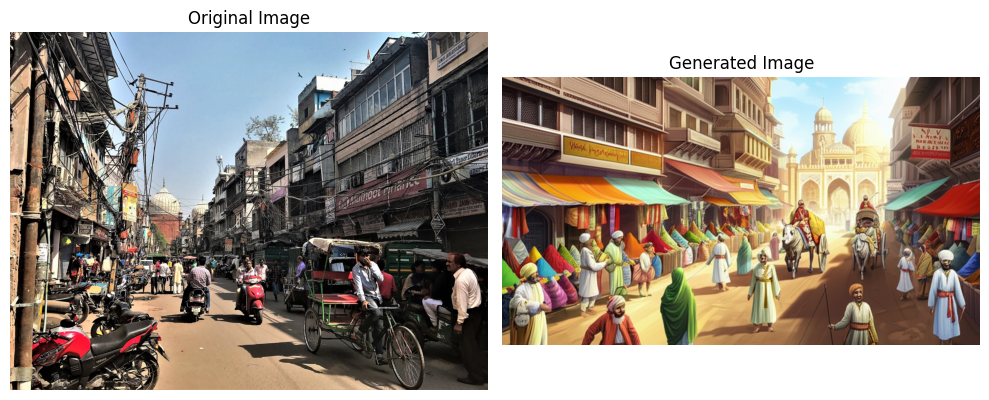

### Historical Audio Narrative


[Gemini Response]: Delhi in 1850 was a fading jewel, once the radiant heart of the Mughal Empire. Its imposing Red Fort, a shell of its former grandeur, still housed the aging and powerless Emperor Bahadur Shah Zafar. Narrow, bustling lanes teemed with life: hawkers cried their wares, scholars debated in shaded courtyards, and the scent of spices and woodsmoke hung heavy in the air. Despite the growing British influence, the city clung fiercely to its Urdu poetry, its aristocratic customs, and its memories of a glorious past, unaware that the storm of 1857 would soon shatter its fragile existence.


Enter the image path:  /kaggle/input/capstone/rome.jpg
Enter a text query (or type 'exit' to quit):  rome 1950


Classified Result: {'era': 'late 1800s', 'style': 'realistic', 'subject': None, 'location': 'Rome', 'subject_hint': 'place'}
Image Analysis: {'description': 'A view of the Colosseum in Rome, Italy, captured at dusk. The scene features a wide street leading towards the Colosseum, flanked by trees and vintage-style streetlights. Cars and pedestrians fill the street, creating a sense of urban activity.', 'elements': 'Colosseum, street, cars, pedestrians, trees, streetlights.', 'subject_type': 'Architecture / Landmark', 'style_hints': 'Photographic, travel photography.', 'keywords_rag': 'Colosseum, Rome, Italy, cityscape', 'keywords_list': ['cityscape', 'colosseum', 'italy', 'rome']}
Combined Query: None Rome late 1800s realistic cityscape colosseum italy rome
Retrieved 1 document(s) from DB.
Final Answer: Imagine stepping back in time to Rome, but not to the days of gladiators! Picture the early 1900s, around the grand Colosseum.

The Colosseum itself is there, majestic but definitely sho

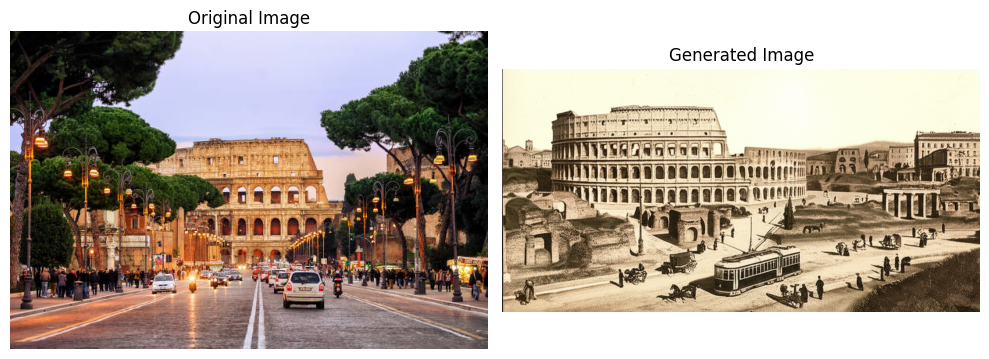

### Historical Audio Narrative


[Gemini Response]: Rome in 1800 was a faded glory, still radiating ancient grandeur but deeply scarred by neglect and papal rule.  The majestic ruins of the Colosseum and Forum stood as silent witnesses to a lost empire, starkly contrasting with the narrow, twisting streets choked with beggars and the odor of uncollected waste.  The power of the Papal States, though diminished, still held sway, with opulent churches and monasteries dominating the skyline.  Artists flocked to the city, drawn by its history and the possibility of patronage, even as political intrigue and simmering discontent brewed beneath the surface of its decaying splendor.  It was a city caught between past magnificence and uncertain future, a theatrical stage set for the dramas of the Napoleonic era.


Enter the image path:  /kaggle/input/capstone/tokyo.jpg
Enter a text query (or type 'exit' to quit):  2070


Classified Result: {'era': 'Not applicable', 'style': 'Not applicable', 'subject': 'Time Period', 'location': 'Not applicable', 'subject_hint': 'place'}
Image Analysis: {'description': 'This is a daytime aerial view of Tokyo, Japan, featuring the Tokyo Tower prominently in the foreground and Mount Fuji in the background. The weather appears clear and sunny, creating a bright and expansive atmosphere.', 'elements': '*   Tokyo Tower', 'subject_type': 'Cityscape/Landscape', 'style_hints': 'Travel Photography, scenic view, stock photo.', 'keywords_rag': '*   Tokyo Tower', 'keywords_list': ['tokyo_tower']}
Combined Query: Time Period Not applicable Not applicable Not applicable tokyo_tower
Retrieved 1 document(s) from DB.
Final Answer: Okay, imagine a city in the year 2070. But this isn't just any city; it's a city that's been built upwards, reaching for the sky!

Think of it like this: Instead of just one street level, there are multiple layers of transportation. Down below, you have elect

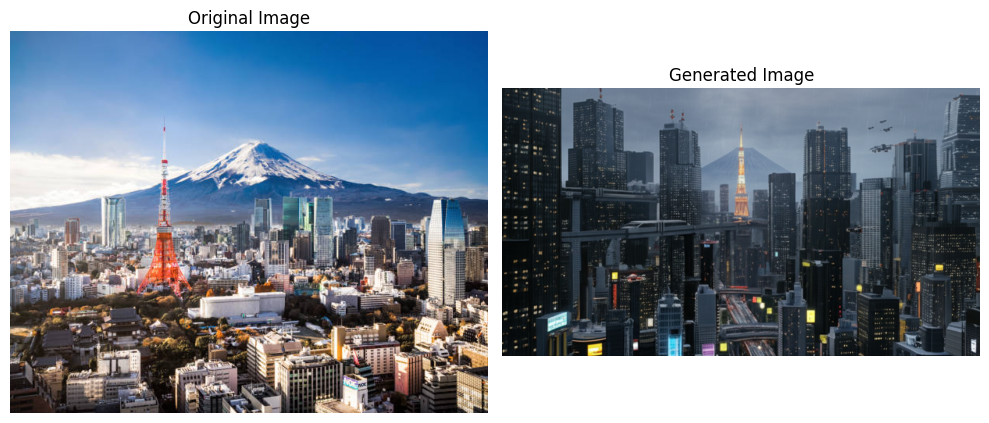

### Futuristic Narrative

Enter the image path:  /kaggle/input/capstone/Hyd.jpeg
Enter a text query (or type 'exit' to quit):  hyderabad 2050


Classified Result: {'era': 'Future', 'style': 'N/A', 'subject': 'Hyderabad city', 'location': 'Hyderabad', 'subject_hint': 'place'}
Image Analysis: {'description': 'A daytime view of Charminar in Hyderabad, India, amidst a bustling street market. The sky is clear, and the atmosphere is lively with vendors and shoppers.', 'elements': 'Charminar, street market, people, stalls, merchandise, minarets.', 'subject_type': 'Architecture/Cityscape.', 'style_hints': 'Documentary photography.', 'keywords_rag': 'Charminar, Hyderabad, India, Street Market.', 'keywords_list': ['charminar', 'hyderabad', 'india', 'street_market.']}
Combined Query: Hyderabad city Hyderabad Future N/A charminar hyderabad india street_market.
Retrieved 1 document(s) from DB.
Final Answer: Okay, let's imagine Hyderabad, but not today – let's jump to **Hyderabad in 2050!**

Now, keep the majestic Charminar in your mind, the heart of the city.

Imagine the Charminar still standing tall, maybe even brighter and better mainta

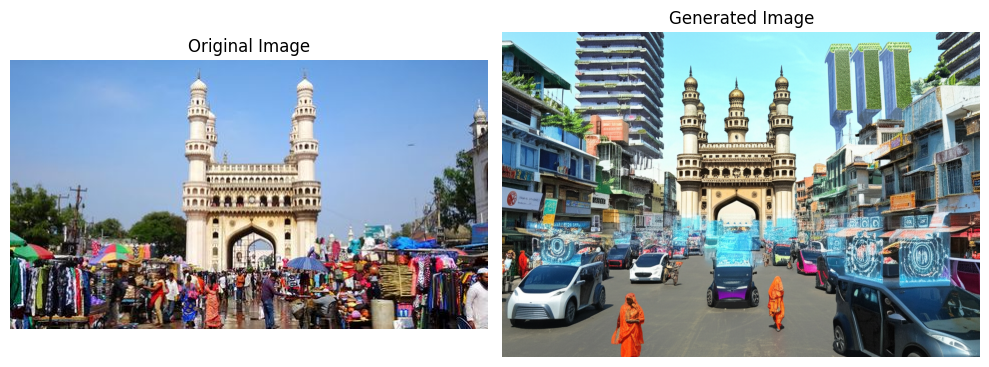

### Futuristic Narrative

Enter the image path:  exit
Enter a text query (or type 'exit' to quit):  exit


Exiting the program.


In [140]:
import re
import datetime
import matplotlib.pyplot as plt
from IPython.display import display, Markdown, Audio
from gtts import gTTS
from io import BytesIO
from PIL import Image

# Function to handle image and error display logic
def display_image_comparison(input_image, generated_image):
    """Display original and generated image side-by-side."""
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(input_image)
    axs[0].set_title("Original Image")
    axs[0].axis('off')
    axs[1].imshow(generated_image)
    axs[1].set_title("Generated Image")
    axs[1].axis('off')
    plt.tight_layout()
    plt.show()

# Function to handle TTS audio generation and playback
def generate_and_play_audio(text):
    """Convert text to speech and display audio."""
    try:
        tts = gTTS(text)
        audio_fp = BytesIO()
        tts.write_to_fp(audio_fp)
        audio_fp.seek(0)
        display(Audio(audio_fp.read(), autoplay=False))
    except Exception as e:
        print("[Error generating or playing audio]:", e)

# Function to extract the era from user text
def get_era_from_text(user_text):
    """Extract the era (year) from the user's input text."""
    classified = classify_user_input(user_text)
    target_era = classified.get("era", "2050")
    try:
        era_year = int(re.search(r"\d{4}", target_era).group())
    except:
        era_year = 2050
    return era_year, classified

# Main user input loop
def user_input_loop(db, client):
    """
    Continuously prompt the user for input until they type 'exit'.
    First asks for an image path, then for a text query, and calls display_summary_and_results.
    """
    while True:
        # Get user input (image path and text query)
        image_path = input("Enter the image path: ").strip()
        if not image_path:
            print("[Error]: Image path is required.")
            continue
        
        user_text = input("Enter a text query (or type 'exit' to quit): ").strip()
        if user_text.lower() == 'exit':
            print("Exiting the program.")
            break

        # Generate image prompt
        image_prompt = generate_image_prompt(user_text, image_path, db)
        if not image_prompt:
            print("[Error]: Failed to generate image prompt.")
            continue

        # Generate image
        generated_image = generate_final_image(image_prompt, client)
        if not isinstance(generated_image, Image.Image):
            print("[Image Gen Error]:", generated_image)
            continue

        # Load and display input image
        try:
            input_image = Image.open(image_path)
        except Exception as e:
            print("[Image Load Error]:", e)
            input_image = None

        if input_image:
            display_image_comparison(input_image, generated_image)
        else:
            display(generated_image)

        # Get era and classification
        era_year, classified = get_era_from_text(user_text)
        current_year = datetime.datetime.now().year

        # Generate either historical or futuristic narrative
        if era_year < current_year:
            display(Markdown("### Historical Audio Narrative"))
            history_prompt = f"Give a concise and vivid historical description of {classified['location']} around {era_year}."
            try:
                response = client.models.generate_content(
                    model="gemini-2.0-flash",
                    contents=history_prompt,
                    config=types.GenerateContentConfig(response_modalities=["text"])
                )
                historical_text = response.text.strip()
                print("\n[Gemini Response]:", historical_text)
                generate_and_play_audio(historical_text)
            except Exception as e:
                print("[Error generating historical summary or TTS]:", e)

        else:
            display(Markdown("### Futuristic Narrative"))
            narrative_prompt = f"Write a short futuristic story describing how {classified['location']} might look in {era_year}. Include believable details and grounding in present-day reality."
            try:
                response = client.models.generate_content(
                    model="gemini-2.0-flash",
                    contents=narrative_prompt,
                    config=types.GenerateContentConfig(response_modalities=["text"])
                )
                narrative_text = response.text.strip()
                generate_and_play_audio(narrative_text)
            except Exception as e:
                print("[Error generating future narrative or TTS]:", e)
user_input_loop(db, client)